In [1]:
import os

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
ds = pd.read_csv("../data/riceClassification.csv")
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               18185 non-null  int64  
 1   Area             18185 non-null  int64  
 2   MajorAxisLength  18185 non-null  float64
 3   MinorAxisLength  18185 non-null  float64
 4   Eccentricity     18185 non-null  float64
 5   ConvexArea       18185 non-null  int64  
 6   EquivDiameter    18185 non-null  float64
 7   Extent           18185 non-null  float64
 8   Perimeter        18185 non-null  float64
 9   Roundness        18185 non-null  float64
 10  AspectRation     18185 non-null  float64
 11  Class            18185 non-null  int64  
dtypes: float64(8), int64(4)
memory usage: 1.7 MB


Пример данных

In [3]:
ds.head()

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1


Уберём столбец с идентификаторами. Очевидно, что они не влияют на результат

In [4]:
ds.drop(['id'], axis=1, inplace=True)

In [5]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             18185 non-null  int64  
 1   MajorAxisLength  18185 non-null  float64
 2   MinorAxisLength  18185 non-null  float64
 3   Eccentricity     18185 non-null  float64
 4   ConvexArea       18185 non-null  int64  
 5   EquivDiameter    18185 non-null  float64
 6   Extent           18185 non-null  float64
 7   Perimeter        18185 non-null  float64
 8   Roundness        18185 non-null  float64
 9   AspectRation     18185 non-null  float64
 10  Class            18185 non-null  int64  
dtypes: float64(8), int64(3)
memory usage: 1.5 MB


Проверим данные на пропуски

In [6]:
ds.isna().sum()

Area               0
MajorAxisLength    0
MinorAxisLength    0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Perimeter          0
Roundness          0
AspectRation       0
Class              0
dtype: int64

Пропусков нет, ничего удалять не нужно

Теперь преобразуем все целочисленные значения к типу float

In [7]:
for column in ds.columns:
    if ds[column].dtype == 'int64':
        ds[column] = ds[column].apply(float)

In [8]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             18185 non-null  float64
 1   MajorAxisLength  18185 non-null  float64
 2   MinorAxisLength  18185 non-null  float64
 3   Eccentricity     18185 non-null  float64
 4   ConvexArea       18185 non-null  float64
 5   EquivDiameter    18185 non-null  float64
 6   Extent           18185 non-null  float64
 7   Perimeter        18185 non-null  float64
 8   Roundness        18185 non-null  float64
 9   AspectRation     18185 non-null  float64
 10  Class            18185 non-null  float64
dtypes: float64(11)
memory usage: 1.5 MB


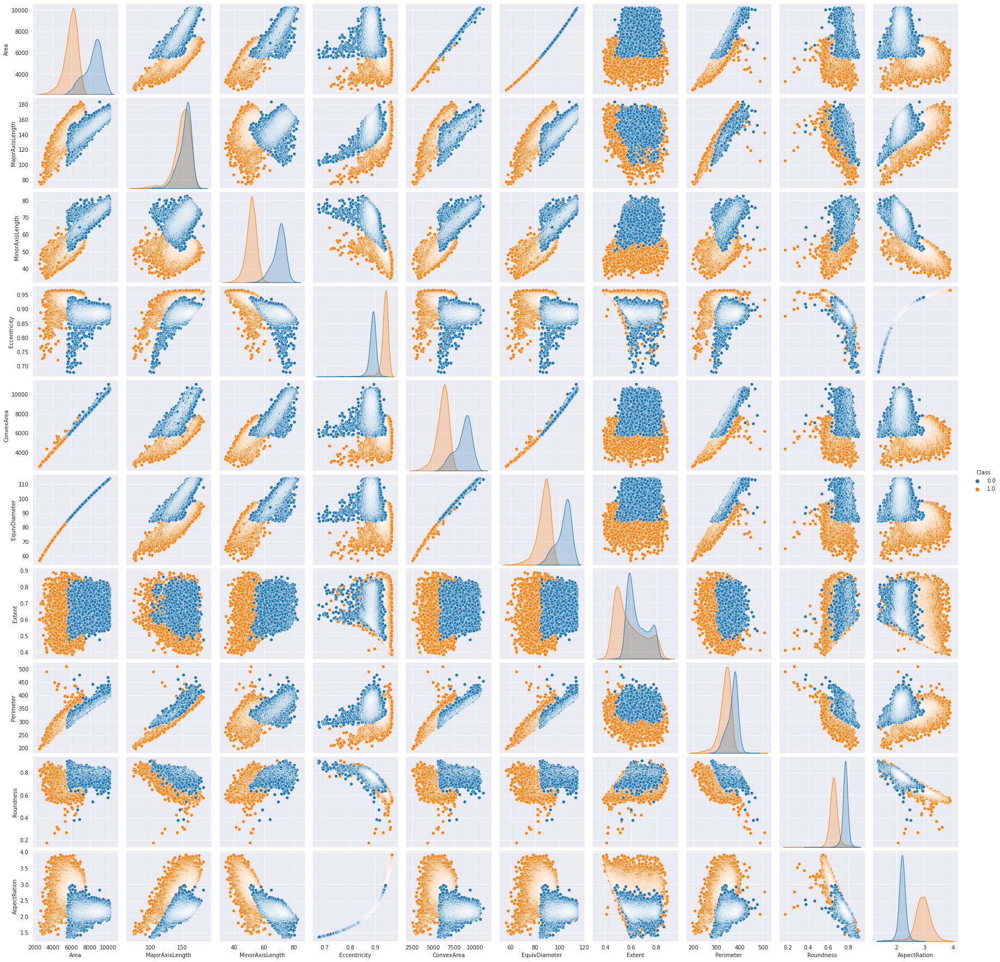

In [9]:
sns.pairplot(data = ds, hue = "Class")
pass

In [10]:
corrMatrix = ds.corr()
corrMatrix

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
Area,1.000000,0.599939,0.930215,-0.550073,0.999362,0.998158,0.230541,0.881540,0.620490,-0.623979,-0.816589
MajorAxisLength,0.599939,1.000000,0.273211,0.295717,0.602061,0.618002,-0.073549,0.870178,-0.202566,0.240471,-0.147741
MinorAxisLength,0.930215,0.273211,1.000000,-0.808640,0.928992,0.923790,0.308541,0.674249,0.834398,-0.860516,-0.917766
Eccentricity,-0.550073,0.295717,-0.808640,1.000000,-0.547896,-0.534688,-0.329954,-0.165915,-0.903657,0.950301,0.788636
ConvexArea,0.999362,0.602061,0.928992,-0.547896,1.000000,0.997403,0.227359,0.886987,0.610236,-0.621472,-0.814214
EquivDiameter,0.998158,0.618002,0.923790,-0.534688,0.997403,1.000000,0.225944,0.891567,0.607432,-0.609957,-0.809361
Extent,0.230541,-0.073549,0.308541,-0.329954,0.227359,0.225944,1.000000,0.073227,0.366793,-0.350875,-0.303440
Perimeter,0.881540,0.870178,0.674249,-0.165915,0.886987,0.891567,0.073227,1.000000,0.186063,-0.227256,-0.533274
Roundness,0.620490,-0.202566,0.834398,-0.903657,0.610236,0.607432,0.366793,0.186063,1.000000,-0.947875,-0.831759
AspectRation,-0.623979,0.240471,-0.860516,0.950301,-0.621472,-0.609957,-0.350875,-0.227256,-0.947875,1.000000,0.832563


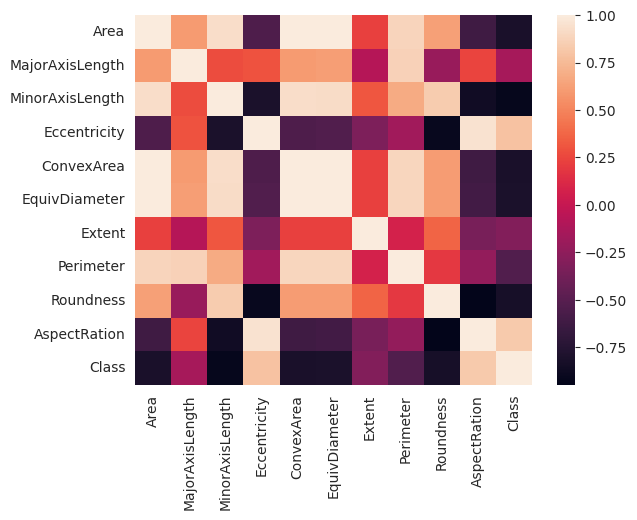

In [11]:
sns.heatmap(corrMatrix)
pass

In [12]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18185 entries, 0 to 18184
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             18185 non-null  float64
 1   MajorAxisLength  18185 non-null  float64
 2   MinorAxisLength  18185 non-null  float64
 3   Eccentricity     18185 non-null  float64
 4   ConvexArea       18185 non-null  float64
 5   EquivDiameter    18185 non-null  float64
 6   Extent           18185 non-null  float64
 7   Perimeter        18185 non-null  float64
 8   Roundness        18185 non-null  float64
 9   AspectRation     18185 non-null  float64
 10  Class            18185 non-null  float64
dtypes: float64(11)
memory usage: 1.5 MB


In [13]:
def visualize(dataset):
    fig, ax = plt.subplots(2, 5, figsize = (20, 10))
    fig.suptitle('Распределения числовых признаков')
    cols = ds.columns
    for i in range(10):
        sns.histplot(ds[cols[i]], ax = ax[i // 5][i % 5], kde = True)
    pass

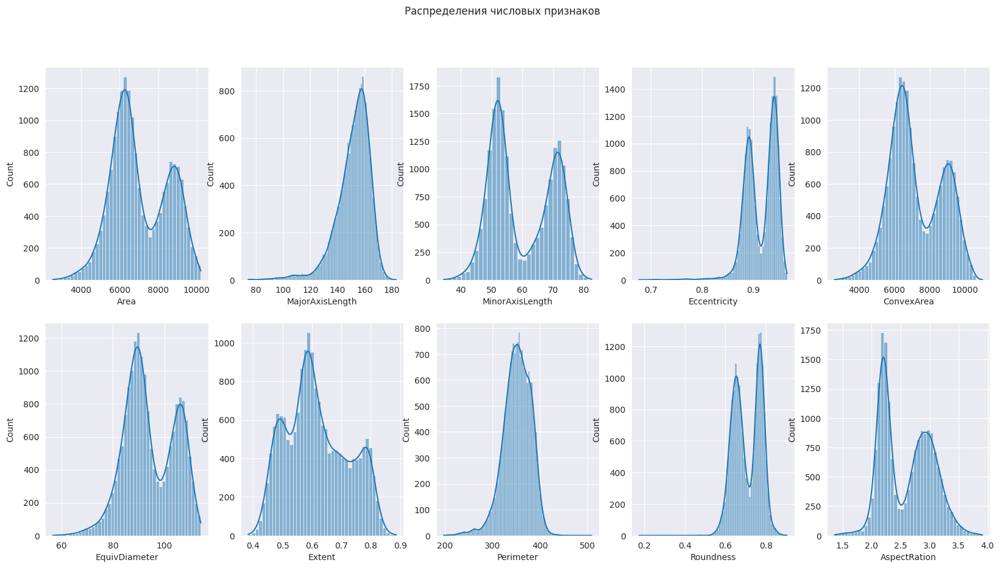

In [14]:
visualize(ds)

Имеется небольшое количество выбросов у некоторых признаков. Удалю все данные, где Roundness < 0.5, Perimeter > 420 и Eccentricity < 0.85

In [15]:
ds = ds.loc[ds['Roundness'] >= 0.5]
ds = ds.loc[ds['Perimeter'] <= 420]
ds = ds.loc[ds['Eccentricity'] >= 0.85]


ds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17863 entries, 89 to 18184
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             17863 non-null  float64
 1   MajorAxisLength  17863 non-null  float64
 2   MinorAxisLength  17863 non-null  float64
 3   Eccentricity     17863 non-null  float64
 4   ConvexArea       17863 non-null  float64
 5   EquivDiameter    17863 non-null  float64
 6   Extent           17863 non-null  float64
 7   Perimeter        17863 non-null  float64
 8   Roundness        17863 non-null  float64
 9   AspectRation     17863 non-null  float64
 10  Class            17863 non-null  float64
dtypes: float64(11)
memory usage: 1.6 MB


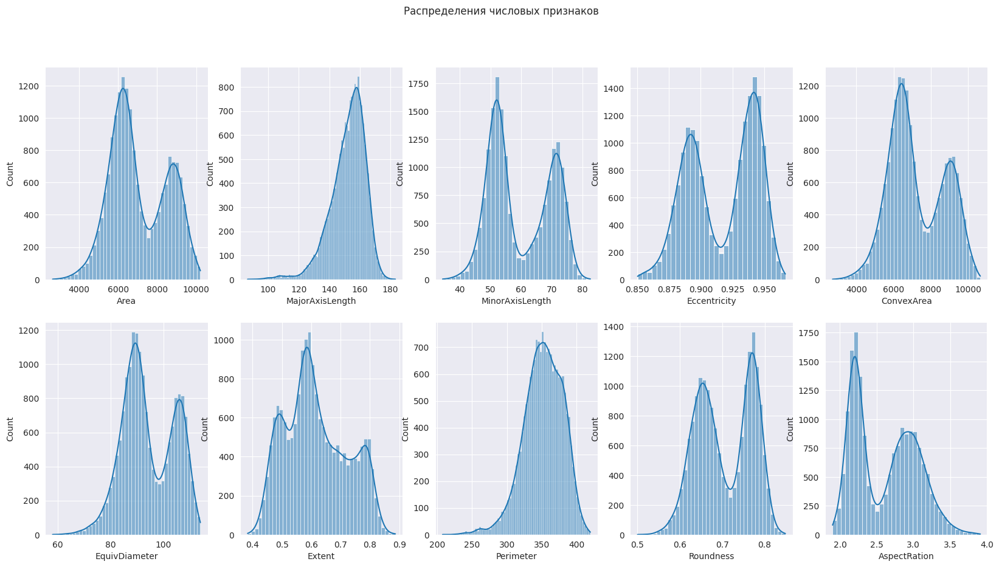

In [16]:
visualize(ds)

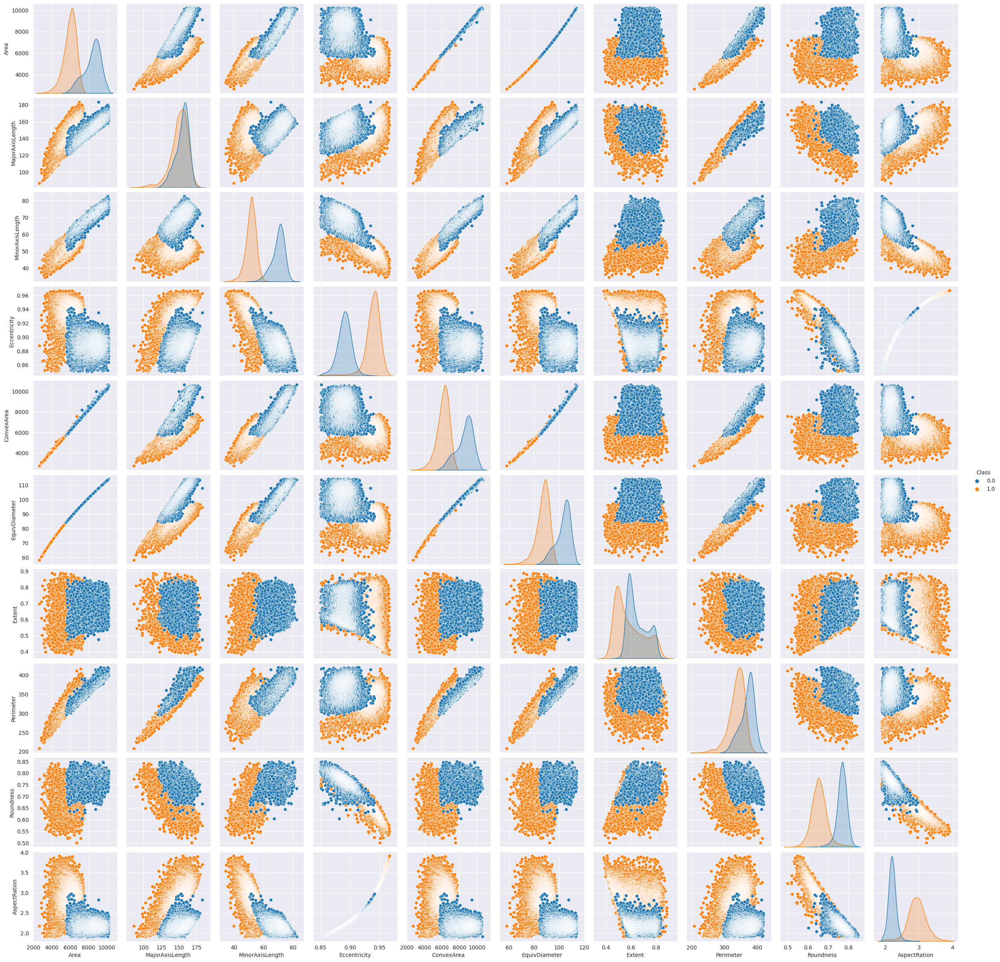

In [17]:
sns.pairplot(data = ds, hue = "Class")
pass

In [18]:
corrMatrix = ds.corr()
corrMatrix

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
Area,1.000000,0.601742,0.946355,-0.690969,0.999454,0.998405,0.241030,0.893676,0.676535,-0.682109,-0.826866
MajorAxisLength,0.601742,1.000000,0.318515,0.143127,0.604078,0.616866,-0.053514,0.873930,-0.138108,0.161874,-0.168496
MinorAxisLength,0.946355,0.318515,1.000000,-0.884381,0.945160,0.941803,0.306820,0.717363,0.858064,-0.877267,-0.917695
Eccentricity,-0.690969,0.143127,-0.884381,1.000000,-0.688548,-0.680375,-0.341642,-0.329682,-0.953128,0.978950,0.874632
ConvexArea,0.999454,0.604078,0.945160,-0.688548,1.000000,0.997779,0.238177,0.897703,0.668161,-0.679602,-0.824445
EquivDiameter,0.998405,0.616866,0.941803,-0.680375,0.997779,1.000000,0.237700,0.902336,0.666823,-0.672446,-0.820879
Extent,0.241030,-0.053514,0.306820,-0.341642,0.238177,0.237700,1.000000,0.096754,0.362806,-0.346367,-0.303015
Perimeter,0.893676,0.873930,0.717363,-0.329682,0.897703,0.902336,0.096754,1.000000,0.282013,-0.312820,-0.560906
Roundness,0.676535,-0.138108,0.858064,-0.953128,0.668161,0.666823,0.362806,0.282013,1.000000,-0.960270,-0.859173
AspectRation,-0.682109,0.161874,-0.877267,0.978950,-0.679602,-0.672446,-0.346367,-0.312820,-0.960270,1.000000,0.853185


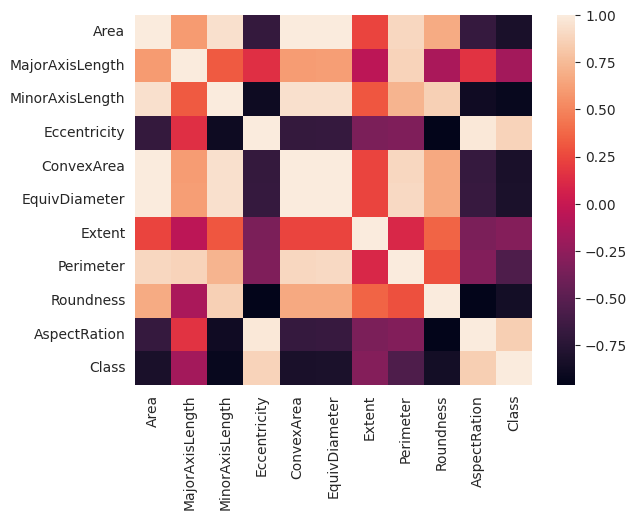

In [19]:
sns.heatmap(corrMatrix)
pass

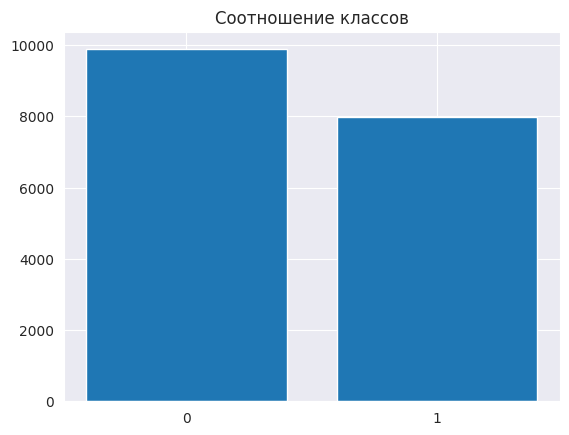

In [20]:
indexes = [0, 1]
cnts = ds['Class'].value_counts().values

plt.title("Соотношение классов")
plt.xticks(indexes)
plt.bar(indexes, cnts)
plt.show()

In [21]:
ds.to_csv('../data/out.csv')

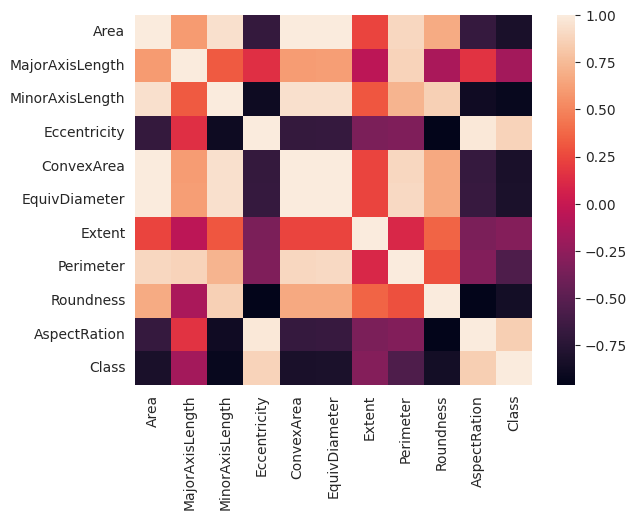

In [22]:
sns.heatmap(corrMatrix)
pass

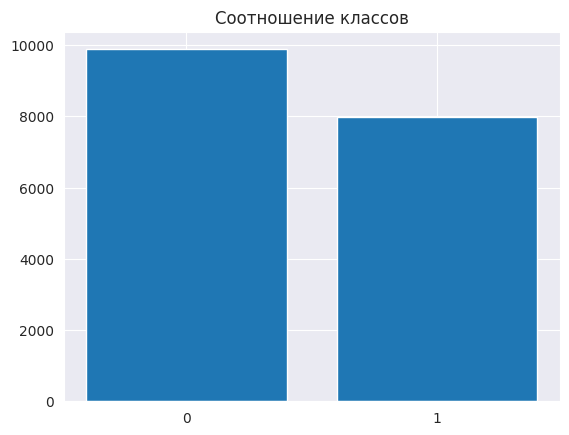

In [23]:
indexes = [0, 1]
cnts = ds['Class'].value_counts().values

plt.title("Соотношение классов")
plt.xticks(indexes)
plt.bar(indexes, cnts)
plt.show()

In [26]:
ds.to_csv('../data/out.csv', index=False)

In [25]:
ds.head()

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
89,4472.0,106.216259,55.861038,0.850535,4642.0,75.458116,0.775312,274.486,0.745884,1.901437,1.0
90,3951.0,100.022328,52.476331,0.851320,4085.0,70.926507,0.563784,253.792,0.770834,1.906047,1.0
91,4621.0,107.515859,56.390835,0.851418,4798.0,76.704889,0.658262,277.531,0.753916,1.906619,1.0
92,4709.0,107.830578,56.550030,0.851451,4801.0,77.431809,0.824405,265.248,0.841074,1.906817,1.0
93,4581.0,106.597203,55.874881,0.851615,4685.0,76.372183,0.565625,266.221,0.812242,1.907784,1.0
